# (Optional) DDIM (Denoising Diffusion Implicit Models): From the DDPM Perspective

<div class="nav-links">
  <a href="../../intro.html">About Me</a>
  <a href="../../publications.html">Publications</a>
  <a href="../../course_notes/my-teaching-philosophy.html">My Teaching</a>
  <a href="../../research_notes/intro.html">Research Notes</a>
</div>

---

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

# ----------------------------
# Dataset: colored pinwheel
# ----------------------------
def make_pinwheel(
    n_samples=1800,
    radial_std=0.28,
    tangential_std=0.10,
    num_classes=5,
    rate=0.25,
    scale=2.4,
    seed=7,
):
    rng = np.random.default_rng(seed)

    counts = np.full(num_classes, n_samples // num_classes, dtype=int)
    counts[: n_samples % num_classes] += 1

    labels = np.concatenate([
        np.full(c, k, dtype=int) for k, c in enumerate(counts)
    ])

    r = rng.normal(loc=1.0, scale=radial_std, size=n_samples)
    t = rng.normal(loc=0.0, scale=tangential_std, size=n_samples)

    base = 2.0 * np.pi * labels / num_classes
    angles = base + rate * np.exp(r) + t

    x = np.stack([r * np.cos(angles), r * np.sin(angles)], axis=1)
    x *= scale

    perm = rng.permutation(n_samples)
    return x[perm], labels[perm]


# ----------------------------
# Diffusion schedule helpers
# ----------------------------
def make_linear_beta_schedule(T, beta_start=1e-4, beta_end=2e-2):
    betas = np.linspace(beta_start, beta_end, T, dtype=np.float64)
    alphas = 1.0 - betas
    alpha_bars = np.cumprod(alphas)
    return betas, alphas, alpha_bars

def get_alpha_bar(alpha_bars, t):
    if t == 0:
        return 1.0
    return float(alpha_bars[t - 1])

def x0_from_eps(x_t, eps_pred, alpha_bar_t, eps=1e-12):
    return (x_t - np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * eps_pred) / np.sqrt(max(alpha_bar_t, eps))

def eps_from_x0(x_t, x0_hat, alpha_bar_t, eps=1e-12):
    denom = np.sqrt(max(1.0 - alpha_bar_t, 0.0))
    if denom < eps:
        return np.zeros_like(x_t)
    return (x_t - np.sqrt(alpha_bar_t) * x0_hat) / denom

def posterior_variance(beta_t, alpha_bar_t, alpha_bar_prev):
    denom = max(1.0 - alpha_bar_t, 1e-12)
    return ((1.0 - alpha_bar_prev) / denom) * beta_t

def ddpm_mean_from_eps(x_t, eps_pred, alpha_t, alpha_bar_t):
    return (x_t - ((1.0 - alpha_t) / np.sqrt(max(1.0 - alpha_bar_t, 1e-12))) * eps_pred) / np.sqrt(max(alpha_t, 1e-12))

def ddim_sigma(alpha_bar_t, alpha_bar_s, eta, eps=1e-12):
    if alpha_bar_t >= 1.0 - eps:
        return 0.0
    inside = ((1.0 - alpha_bar_s) / max(1.0 - alpha_bar_t, eps)) * \
             max(1.0 - alpha_bar_t / max(alpha_bar_s, eps), 0.0)
    return float(eta) * np.sqrt(max(inside, 0.0))

def ddim_step_general(x_t, eps_pred, alpha_bar_t, alpha_bar_s, eta, rng):
    x0_hat = x0_from_eps(x_t, eps_pred, alpha_bar_t)
    sigma_ts = ddim_sigma(alpha_bar_t, alpha_bar_s, eta)
    dir_coeff = np.sqrt(max(1.0 - alpha_bar_s - sigma_ts**2, 0.0))
    z = rng.normal(size=x_t.shape)
    x_s = np.sqrt(max(alpha_bar_s, 0.0)) * x0_hat + dir_coeff * eps_pred + sigma_ts * z
    return x_s, x0_hat, sigma_ts


# ----------------------------
# Pedagogical "denoisers"
# ----------------------------
def compute_class_prototypes(x0, y, num_classes):
    prototypes = np.zeros((num_classes, 2), dtype=np.float64)
    for k in range(num_classes):
        prototypes[k] = x0[y == k].mean(axis=0)
    return prototypes

def true_eps_from_clean_pair(x_t, x0_true, alpha_bar_t):
    return eps_from_x0(x_t, x0_true, alpha_bar_t)

def unconditional_eps_model(x_t, x0_true, prototypes, y, alpha_bar_t):
    proto = prototypes[y]
    x0_blend = 0.72 * x0_true + 0.28 * proto
    eps_uncond = eps_from_x0(x_t, x0_blend, alpha_bar_t)
    smooth_bias = 0.10 * x_t
    return 0.92 * eps_uncond + 0.08 * smooth_bias

def conditional_eps_model(x_t, x0_true, alpha_bar_t):
    return true_eps_from_clean_pair(x_t, x0_true, alpha_bar_t)

def cfg_eps(eps_uncond, eps_cond, guidance_scale):
    return eps_uncond + guidance_scale * (eps_cond - eps_uncond)

def classifier_guidance_eps(eps_uncond, x_t, y, prototypes, alpha_bar_t, guidance_scale):
    target = prototypes[y]
    grad = target - x_t
    return eps_uncond - guidance_scale * np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * grad


# ----------------------------
# Simulation helpers
# ----------------------------
def forward_corrupt(x0, alpha_bar_t, rng):
    eps = rng.normal(size=x0.shape)
    x_t = np.sqrt(alpha_bar_t) * x0 + np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * eps
    return x_t, eps

def make_timestep_subsequence(T, num_steps):
    seq = np.linspace(T, 0, num_steps, dtype=int)
    seq = np.unique(seq)[::-1]
    if seq[0] != T:
        seq = np.insert(seq, 0, T)
    if seq[-1] != 0:
        seq = np.append(seq, 0)
    return seq

def class_colors(y, cmap_name="tab10"):
    cmap = plt.get_cmap(cmap_name)
    classes = np.unique(y)
    color_map = {k: cmap(i % 10) for i, k in enumerate(classes)}
    return np.array([color_map[k] for k in y])

def axis_limits(*arrays, pad=0.7):
    mins = np.min(np.concatenate(arrays, axis=0), axis=0)
    maxs = np.max(np.concatenate(arrays, axis=0), axis=0)
    center = 0.5 * (mins + maxs)
    radius = 0.5 * np.max(maxs - mins) + pad
    return (center[0] - radius, center[0] + radius), (center[1] - radius, center[1] + radius)

def ddpm_ancestral_step(x_t, eps_pred, t, betas, alphas, alpha_bars, rng):
    alpha_t = alphas[t - 1]
    beta_t = betas[t - 1]
    alpha_bar_t = get_alpha_bar(alpha_bars, t)
    alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)

    mu = ddpm_mean_from_eps(x_t, eps_pred, alpha_t, alpha_bar_t)
    sigma = np.sqrt(max(posterior_variance(beta_t, alpha_bar_t, alpha_bar_prev), 0.0))
    z = rng.normal(size=x_t.shape)
    return mu + sigma * z

def simulate_ddpm_sequence(x0, y, x_T, betas, alphas, alpha_bars, prototypes, T=120, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    states = [x_t.copy()]
    seq = np.arange(T, -1, -1)

    for t in range(T, 0, -1):
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        eps_pred = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        x_t = ddpm_ancestral_step(x_t, eps_pred, t, betas, alphas, alpha_bars, rng)
        states.append(x_t.copy())

    return seq, states

def simulate_ddim_sequence(x0, y, x_T, alpha_bars, prototypes, T=120, num_steps=18, eta=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    seq = make_timestep_subsequence(T, num_steps)
    states = [x_t.copy()]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_pred = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        x_t, _, _ = ddim_step_general(x_t, eps_pred, alpha_bar_t, alpha_bar_s, eta, rng)
        states.append(x_t.copy())

    return seq, states

def simulate_classifier_guided_ddim_sequence(x0, y, x_T, alpha_bars, prototypes, T=120, guidance_scale=0.55, num_steps=28, eta=0.05, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    seq = make_timestep_subsequence(T, num_steps)
    states = [x_t.copy()]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_u = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        eps_guided = classifier_guidance_eps(eps_u, x_t, y, prototypes, alpha_bar_t, guidance_scale)
        x_t, _, _ = ddim_step_general(x_t, eps_guided, alpha_bar_t, alpha_bar_s, eta, rng)
        states.append(x_t.copy())

    return seq, states

def simulate_cfg_ddim_sequence(x0, y, x_T, alpha_bars, prototypes, T=120, guidance_scale=3.0, num_steps=28, eta=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    seq = make_timestep_subsequence(T, num_steps)
    states = [x_t.copy()]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])

        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_u = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        eps_c = conditional_eps_model(x_t, x0, alpha_bar_t)
        eps_guided = cfg_eps(eps_u, eps_c, guidance_scale)

        x_t, _, _ = ddim_step_general(x_t, eps_guided, alpha_bar_t, alpha_bar_s, eta, rng)
        states.append(x_t.copy())

    return seq, states

def upsample_states_to_common_length(states, target_len):
    idx = np.linspace(0, len(states) - 1, target_len)
    idx = np.round(idx).astype(int)
    return [states[i] for i in idx]

def upsample_seq_to_common_length(seq, target_len):
    idx = np.linspace(0, len(seq) - 1, target_len)
    idx = np.round(idx).astype(int)
    return [int(seq[i]) for i in idx]

# ============================================================
# Animation 1: 4-panel comparison (memory-safe version)
# DDPM vs DDIM vs classifier guidance vs CFG
# ============================================================

# ----------------------------
# 1) Data and shared start noise
# ----------------------------
T = 120

x0, y = make_pinwheel(
    n_samples=1200,
    radial_std=0.28,
    tangential_std=0.10,
    num_classes=5,
    rate=0.28,
    scale=2.5,
    seed=12,
)

colors = class_colors(y)
num_classes = len(np.unique(y))
prototypes = compute_class_prototypes(x0, y, num_classes)

betas, alphas, alpha_bars = make_linear_beta_schedule(T)

rng_master = np.random.default_rng(5)
alpha_bar_T = get_alpha_bar(alpha_bars, T)
x_T, _ = forward_corrupt(x0, alpha_bar_T, rng_master)

# ----------------------------
# 2) Simulate all four panels from the same x_T
# ----------------------------
seq_ddpm, states_ddpm = simulate_ddpm_sequence(
    x0, y, x_T, betas, alphas, alpha_bars, prototypes, T=T, seed=11
)

seq_ddim, states_ddim = simulate_ddim_sequence(
    x0, y, x_T, alpha_bars, prototypes, T=T, num_steps=16, eta=0.0, seed=11
)

seq_cg, states_cg = simulate_classifier_guided_ddim_sequence(
    x0, y, x_T, alpha_bars, prototypes, T=T, guidance_scale=0.55, num_steps=20, eta=0.05, seed=11
)

seq_cfg, states_cfg = simulate_cfg_ddim_sequence(
    x0, y, x_T, alpha_bars, prototypes, T=T, guidance_scale=3.0, num_steps=20, eta=0.0, seed=11
)

# ----------------------------
# 3) Aggressively reduce displayed frames
# ----------------------------
def subsample_sequence_and_states(seq, states, target_frames):
    idx = np.linspace(0, len(states) - 1, target_frames)
    idx = np.round(idx).astype(int)
    idx = np.unique(idx)
    seq_sub = [int(seq[i]) for i in idx]
    states_sub = [states[i] for i in idx]
    return seq_sub, states_sub

TARGET_FRAMES = 18

seq_ddpm_s, states_ddpm_s = subsample_sequence_and_states(seq_ddpm, states_ddpm, TARGET_FRAMES)
seq_ddim_s, states_ddim_s = subsample_sequence_and_states(seq_ddim, states_ddim, TARGET_FRAMES)
seq_cg_s, states_cg_s     = subsample_sequence_and_states(seq_cg, states_cg, TARGET_FRAMES)
seq_cfg_s, states_cfg_s   = subsample_sequence_and_states(seq_cfg, states_cfg, TARGET_FRAMES)

common_frames = min(
    len(states_ddpm_s),
    len(states_ddim_s),
    len(states_cg_s),
    len(states_cfg_s),
)

states_ddpm_u = states_ddpm_s[:common_frames]
states_ddim_u = states_ddim_s[:common_frames]
states_cg_u   = states_cg_s[:common_frames]
states_cfg_u  = states_cfg_s[:common_frames]

seq_ddpm_u = seq_ddpm_s[:common_frames]
seq_ddim_u = seq_ddim_s[:common_frames]
seq_cg_u   = seq_cg_s[:common_frames]
seq_cfg_u  = seq_cfg_s[:common_frames]

all_states = [x0, x_T] + states_ddpm_u + states_ddim_u + states_cg_u + states_cfg_u
xlim, ylim = axis_limits(*all_states, pad=0.9)

# ----------------------------
# 4) Figure setup
# ----------------------------
fig, axes = plt.subplots(2, 2, figsize=(12.6, 10.9))
axes = axes.ravel()

panel_titles = [
    "DDPM ancestral sampling",
    "DDIM with stronger timestep skipping",
    "DDIM + classifier guidance",
    "DDIM + classifier-free guidance",
]

for ax, title in zip(axes, panel_titles):
    ax.set_title(title, pad=6)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_aspect("equal")
    ax.grid(True, alpha=0.25)
    ax.scatter(x0[:, 0], x0[:, 1], s=5, c="lightgray", alpha=0.15, linewidths=0)

axes[2].scatter(
    prototypes[:, 0], prototypes[:, 1],
    s=150, marker='X',
    c=np.unique(colors, axis=0)[:len(prototypes)],
    edgecolors='black', linewidths=1.0, alpha=0.95
)

panel_states = [states_ddpm_u, states_ddim_u, states_cg_u, states_cfg_u]
panel_seqs   = [seq_ddpm_u,   seq_ddim_u,   seq_cg_u,   seq_cfg_u]

scatters = []
for ax, st in zip(axes, panel_states):
    sc = ax.scatter(st[0][:, 0], st[0][:, 1], s=9, c=colors, alpha=0.82, linewidths=0)
    scatters.append(sc)

text_boxes = []
box_texts = [
    "fresh Gaussian noise\nadded every reverse step",
    "same denoiser idea\nbut fewer reverse steps",
    "classifier gradient nudges\ntoward class-consistent regions",
    "conditional correction is\namplified in ε-space",
]

for ax, txt in zip(axes, box_texts):
    tb = ax.text(
        0.02, 0.98, txt,
        transform=ax.transAxes,
        va='top', ha='left',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.82, edgecolor='none'),
        fontsize=10
    )
    text_boxes.append(tb)

axes[2].text(
    0.02, 0.06,
    r'$\epsilon_{\mathrm{guided}} = \epsilon_{\mathrm{u}} - \lambda\sqrt{1-\bar{\alpha}_t}\,\nabla_{x_t}\log p(y|x_t)$',
    transform=axes[2].transAxes,
    va='bottom', ha='left',
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.82, edgecolor='none'),
    fontsize=9
)

axes[3].text(
    0.02, 0.06,
    r'$\epsilon_{\mathrm{cfg}} = \epsilon_{\mathrm{u}} + w(\epsilon_{\mathrm{c}}-\epsilon_{\mathrm{u}})$',
    transform=axes[3].transAxes,
    va='bottom', ha='left',
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.82, edgecolor='none'),
    fontsize=10
)

suptitle = fig.suptitle(
    "DDPM vs DDIM vs guidance on a colored pinwheel dataset",
    fontsize=15,
    y=0.965
)

fig.subplots_adjust(
    left=0.055,
    right=0.985,
    bottom=0.055,
    top=0.91,
    wspace=0.11,
    hspace=0.15
)

# ----------------------------
# 5) Animation update
# ----------------------------
def update(frame):
    for sc, st in zip(scatters, panel_states):
        sc.set_offsets(st[frame])

    text_boxes[0].set_text(
        f"ancestral DDPM\n"
        f"current t = {panel_seqs[0][frame]}\n"
        f"fresh noise each step"
    )

    text_boxes[1].set_text(
        f"DDIM with skipping\n"
        f"current t = {panel_seqs[1][frame]}\n"
        f"deterministic path"
    )

    text_boxes[2].set_text(
        f"classifier guidance\n"
        f"scale = 0.55\n"
        f"current t = {panel_seqs[2][frame]}"
    )

    text_boxes[3].set_text(
        f"CFG\n"
        f"scale = 3.0\n"
        f"current t = {panel_seqs[3][frame]}"
    )

    return scatters + text_boxes + [suptitle]

anim = FuncAnimation(
    fig,
    update,
    frames=common_frames,
    interval=280,
    blit=False,
    repeat=True
)

plt.close(fig)
display(HTML(anim.to_jshtml()))

This notebook assumes you already understand DDPMs well, including:

- the forward diffusion process
- the closed-form marginal $q(x_t \mid x_0)$
- the posterior $q(x_{t-1}\mid x_t, x_0)$
- the learned reverse model $p_\theta(x_{t-1}\mid x_t)$
- ELBO training
- $\epsilon$-prediction, $x_0$-prediction, and $v$-prediction
- ancestral sampling

The goal here is to study **DDIM rigorously and carefully as a new sampler built on top of the DDPM training setup**.

We will keep notation consistent with standard DDPM notation:

- $x_0$: clean sample
- $x_t$: noisy sample at timestep $t$
- $\alpha_t = 1 - \beta_t$
- $\bar\alpha_t = \prod_{s=1}^t \alpha_s$
- $\epsilon_\theta(x_t,t)$: model-predicted noise
- $\hat x_0$: reconstructed clean sample estimate
- $v_\theta(x_t,t)$: velocity prediction, when used

The notebook is structured as a technical tutorial:

1. prerequisites beyond DDPM
2. DDPM sampling recap
3. DDIM intuition
4. DDIM derivation
5. deterministic vs stochastic DDIM
6. timestep sub-sampling
7. classifier guidance
8. classifier-free guidance
9. implementation notes
10. common confusions
11. summary and comparison


In [21]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["axes.grid"] = True
plt.rcParams["font.size"] = 11

## Prerequisites Beyond DDPM

To understand DDIM properly, we need a few ideas beyond standard DDPM derivations.

### 1. What part of DDPM sampling is stochastic?

In ancestral DDPM sampling, the reverse transition is Gaussian:

$$
p_\theta(x_{t-1}\mid x_t) = \mathcal N\!\big(\mu_\theta(x_t,t), \Sigma_\theta(x_t,t)\big).
$$

In the common scalar-variance case,

$$
\Sigma_\theta(x_t,t) = \sigma_t^2 I,
$$

so one reverse step is

$$
x_{t-1} = \mu_\theta(x_t,t) + \sigma_t z, \qquad z \sim \mathcal N(0,I).
$$

Thus the **fresh Gaussian term** $\sigma_t z$ is the explicit source of stochasticity during reverse sampling.

---

### 2. What quantity determines randomness?

The amount of randomness is controlled by the reverse variance:

$$
\sigma_t^2.
$$

In standard DDPM ancestral sampling, this is typically chosen as the posterior variance

$$
\tilde\beta_t
=
\frac{1-\bar\alpha_{t-1}}{1-\bar\alpha_t}\beta_t.
$$

So the reverse randomness at each step is determined by the scale of $\sigma_t$.

---

### 3. Deterministic vs stochastic trajectories

A reverse generative trajectory is the chain

$$
x_T \to x_{T-1} \to \cdots \to x_0.
$$

- If every step includes fresh noise, the trajectory is **stochastic**.
- If no fresh noise is added, the trajectory is **deterministic** once $x_T$ is fixed.

DDIM will let us continuously interpolate between these cases.

---

### 4. Why can different samplers share the same training objective?

The DDPM training objective for $\epsilon$-prediction uses the relation

$$
x_t = \sqrt{\bar\alpha_t}\,x_0 + \sqrt{1-\bar\alpha_t}\,\epsilon, \qquad \epsilon \sim \mathcal N(0,I).
$$

The model learns to predict $\epsilon$ from $(x_t, t)$.

Crucially, this training target depends on the marginal corruption distribution $q(x_t\mid x_0)$, not necessarily on one unique ancestral reverse chain. Therefore, if we build another sampler that is compatible with the same marginals, the same trained denoiser can still be used.

This is the central idea behind DDIM.

---

### 5. Relation between $\epsilon$-prediction and $x_0$-prediction

From

$$
x_t = \sqrt{\bar\alpha_t}x_0 + \sqrt{1-\bar\alpha_t}\epsilon,
$$

we solve for $x_0$:

$$
x_0 = \frac{x_t - \sqrt{1-\bar\alpha_t}\epsilon}{\sqrt{\bar\alpha_t}}.
$$

Replacing the unknown $\epsilon$ by the model prediction gives

$$
\hat x_0(x_t,t)
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

This clean/noise decomposition is the key bridge from DDPM to DDIM.

---

### 6. Why DDIM is a family of samplers

DDIM is not just one update rule. It is a family parameterized by:

- a timestep subsequence
- a stochasticity control parameter $\eta$

This means:

- $\eta = 0$ gives deterministic DDIM
- $\eta > 0$ gives stochastic DDIM
- using all steps gives dense sampling
- using a sparse timestep subset gives accelerated sampling


In [22]:
def make_linear_beta_schedule(T, beta_start=1e-4, beta_end=2e-2):
    betas = np.linspace(beta_start, beta_end, T, dtype=np.float64)
    alphas = 1.0 - betas
    alpha_bars = np.cumprod(alphas)
    return betas, alphas, alpha_bars

def prepend_one(alpha_bars):
    return np.concatenate([[1.0], alpha_bars])

def get_alpha_bar(alpha_bars, t):
    # Here t is an integer in [0, T], with alpha_bar_0 = 1 by convention.
    if t == 0:
        return 1.0
    return alpha_bars[t - 1]

## DDPM Sampling Recap

We now recall the exact DDPM formulas needed to derive DDIM.

### Forward marginal

The closed-form forward marginal is

$$
q(x_t \mid x_0)
=
\mathcal N\!\big(\sqrt{\bar\alpha_t}\,x_0,\ (1-\bar\alpha_t)I\big),
$$

which is equivalent to

$$
x_t = \sqrt{\bar\alpha_t}\,x_0 + \sqrt{1-\bar\alpha_t}\,\epsilon,
\qquad
\epsilon \sim \mathcal N(0,I).
$$

---

### Reconstructing $\hat x_0$

Given a model prediction $\epsilon_\theta(x_t,t)$, we reconstruct the clean sample as

$$
\hat x_0(x_t,t)
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

This is obtained by solving the forward corruption equation for $x_0$.

---

### Posterior mean in DDPM

The exact posterior is

$$
q(x_{t-1}\mid x_t, x_0)
=
\mathcal N\!\big(x_{t-1};\ \tilde\mu_t(x_t,x_0),\ \tilde\beta_t I\big),
$$

where

$$
\tilde\mu_t(x_t,x_0)
=
\frac{\sqrt{\bar\alpha_{t-1}}\beta_t}{1-\bar\alpha_t}x_0
+
\frac{\sqrt{\alpha_t}(1-\bar\alpha_{t-1})}{1-\bar\alpha_t}x_t
$$

and

$$
\tilde\beta_t
=
\frac{1-\bar\alpha_{t-1}}{1-\bar\alpha_t}\beta_t.
$$

Replacing $x_0$ by $\hat x_0$ gives the learned DDPM mean.

---

### DDPM reverse mean in $\epsilon$-parameterization

A standard form for the learned reverse mean is

$$
\mu_\theta(x_t,t)
=
\frac{1}{\sqrt{\alpha_t}}
\left(
x_t - \frac{1-\alpha_t}{\sqrt{1-\bar\alpha_t}}\epsilon_\theta(x_t,t)
\right).
$$

This can also be rewritten in the very important signal/noise form

$$
\mu_\theta(x_t,t)
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\frac{\sqrt{\alpha_t}(1-\bar\alpha_{t-1})}{\sqrt{1-\bar\alpha_t}}\epsilon_\theta(x_t,t).
$$

---

### Ancestral DDPM update

The full ancestral sampling step is

$$
x_{t-1}
=
\mu_\theta(x_t,t) + \sigma_t z,
\qquad z \sim \mathcal N(0,I),
$$

often with

$$
\sigma_t^2 = \tilde\beta_t.
$$

Thus DDPM sampling is stochastic because it injects fresh noise at every reverse step.

In [23]:
def x0_from_eps(x_t, eps_pred, alpha_bar_t):
    alpha_bar_t = float(alpha_bar_t)
    return (x_t - np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * eps_pred) / np.sqrt(max(alpha_bar_t, 1e-12))

def eps_from_x0(x_t, x0_hat, alpha_bar_t):
    alpha_bar_t = float(alpha_bar_t)
    denom = np.sqrt(max(1.0 - alpha_bar_t, 0.0))
    if denom < 1e-12:
        # At t = 0, alpha_bar_t = 1, so there is no remaining noise.
        # Returning zeros is a safe convention for notebook demos.
        return np.zeros_like(x_t, dtype=np.float64)
    return (x_t - np.sqrt(alpha_bar_t) * x0_hat) / denom

def posterior_variance(beta_t, alpha_bar_t, alpha_bar_prev):
    return ((1.0 - alpha_bar_prev) / (1.0 - alpha_bar_t)) * beta_t

def ddpm_mean_from_eps(x_t, eps_pred, alpha_t, alpha_bar_t):
    return (x_t - ((1.0 - alpha_t) / np.sqrt(1.0 - alpha_bar_t)) * eps_pred) / np.sqrt(alpha_t)

def ddpm_mean_from_x0_eps(x0_hat, eps_pred, alpha_t, alpha_bar_t, alpha_bar_prev):
    coeff_eps = np.sqrt(alpha_t) * (1.0 - alpha_bar_prev) / np.sqrt(1.0 - alpha_bar_t)
    return np.sqrt(alpha_bar_prev) * x0_hat + coeff_eps * eps_pred

In [24]:
# Verify numerically that the two DDPM mean formulas match

T = 100
betas, alphas, alpha_bars = make_linear_beta_schedule(T)

t = 60
alpha_t = alphas[t - 1]
alpha_bar_t = alpha_bars[t - 1]
alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)

x_t = np.array([0.7])
eps_pred = np.array([-0.4])

x0_hat = x0_from_eps(x_t, eps_pred, alpha_bar_t)
mu1 = ddpm_mean_from_eps(x_t, eps_pred, alpha_t, alpha_bar_t)
mu2 = ddpm_mean_from_x0_eps(x0_hat, eps_pred, alpha_t, alpha_bar_t, alpha_bar_prev)

print("x0_hat =", x0_hat)
print("DDPM mean form 1 =", mu1)
print("DDPM mean form 2 =", mu2)
print("Absolute difference =", np.abs(mu1 - mu2))

x0_hat = [1.10414082]
DDPM mean form 1 = [0.71294411]
DDPM mean form 2 = [0.71294411]
Absolute difference = [2.22044605e-16]


## DDIM Intuition

DDIM starts from a simple but powerful observation.

At timestep $t$, the model gives us an estimate of the clean sample:

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

If we now want a sample at another noise level, say timestep $s < t$, then the forward noising formula suggests the generic decomposition

$$
x_s = \sqrt{\bar\alpha_s}x_0 + \sqrt{1-\bar\alpha_s}\epsilon.
$$

So if we replace $x_0$ by $\hat x_0$ and use the model's inferred direction $\epsilon_\theta(x_t,t)$, we can directly synthesize a point at the lower noise level.

This is the core geometric idea of DDIM:

- estimate the clean content
- move to a new noise level
- optionally inject fresh noise
- otherwise follow a deterministic trajectory

---

### Big picture: what changes from DDPM?

DDPM uses the posterior-inspired ancestral step

$$
x_{t-1} = \mu_\theta(x_t,t) + \sigma_t z.
$$

DDIM instead uses a more direct reparameterized step that explicitly separates:

1. the clean-content term
2. the model-predicted direction term
3. the optional fresh-noise term

This makes timestep skipping natural and allows deterministic generation.

---

### Why DDPM sampling is slow

DDPM ancestral sampling usually uses many small reverse steps. Each step requires a neural network evaluation. Therefore inference is expensive.

DDIM accelerates sampling by allowing transitions between a chosen subset of timesteps, often dramatically reducing the number of function evaluations.

---

### What does "implicit" mean here?

In deterministic DDIM, generation becomes a deterministic transformation from initial noise $x_T$ to final sample $x_0$:

$$
x_T \mapsto x_0.
$$

This no longer relies on explicit ancestral resampling at every reverse transition. The model defines an implicit denoising trajectory rather than sampling each reverse conditional in the original DDPM ancestral way.


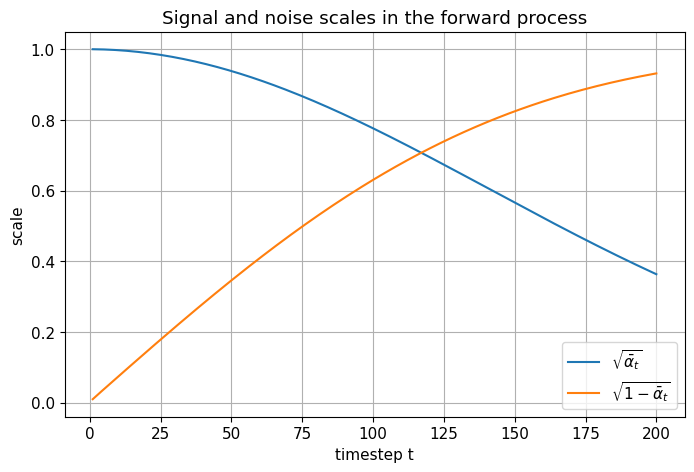

In [25]:
# Visualize alpha_bar_t and noise magnitude as a function of timestep

T = 200
betas, alphas, alpha_bars = make_linear_beta_schedule(T)
timesteps = np.arange(1, T + 1)

signal_scales = np.sqrt(alpha_bars)
noise_scales = np.sqrt(1.0 - alpha_bars)

plt.figure()
plt.plot(timesteps, signal_scales, label=r'$\sqrt{\bar{\alpha}_t}$')
plt.plot(timesteps, noise_scales, label=r'$\sqrt{1-\bar{\alpha}_t}$')
plt.xlabel("timestep t")
plt.ylabel("scale")
plt.title("Signal and noise scales in the forward process")
plt.legend()
plt.show()

## DDIM Derivation

We now derive the DDIM update carefully.

### Step 1: Start from the noisy-sample identity

At timestep $t$,

$$
x_t = \sqrt{\bar\alpha_t}x_0 + \sqrt{1-\bar\alpha_t}\epsilon.
$$

Solving for $x_0$ gives

$$
x_0 = \frac{x_t - \sqrt{1-\bar\alpha_t}\epsilon}{\sqrt{\bar\alpha_t}}.
$$

Replacing the unknown $\epsilon$ by the network prediction yields

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

---

### Step 2: Ask what a point at timestep $t-1$ should look like

At timestep $t-1$, the forward marginal would have the form

$$
x_{t-1} = \sqrt{\bar\alpha_{t-1}}x_0 + \sqrt{1-\bar\alpha_{t-1}}\epsilon'.
$$

DDIM constructs a reverse step by using the estimated clean sample $\hat x_0$ and decomposing the remaining noise budget into:

- a model-aligned direction term
- an optional fresh Gaussian term

So we write

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z,
\qquad z \sim \mathcal N(0,I).
$$

This is the generalized DDIM update.

---

### Step 3: Why does the coefficient of $\epsilon_\theta$ look like that?

At timestep $t-1$, the total variance budget should be

$$
1-\bar\alpha_{t-1}.
$$

DDIM splits this budget into two parts:

$$
1-\bar\alpha_{t-1}
=
\big(1-\bar\alpha_{t-1}-\sigma_t^2\big) + \sigma_t^2.
$$

So:

- the direction term gets variance magnitude $1-\bar\alpha_{t-1}-\sigma_t^2$
- the fresh-noise term gets variance magnitude $\sigma_t^2$

This explains the structure

$$
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t).
$$

---

### Step 4: Generalized DDIM variance scale

DDIM defines

$$
\sigma_t(\eta)
=
\eta
\sqrt{
\frac{1-\bar\alpha_{t-1}}{1-\bar\alpha_t}
\left(
1 - \frac{\bar\alpha_t}{\bar\alpha_{t-1}}
\right)
}.
$$

This introduces the stochasticity parameter $\eta$.

- $\eta = 0$ gives deterministic DDIM
- $\eta > 0$ gives stochastic DDIM
- $\eta = 1$ matches DDPM posterior variance for adjacent steps

---

### Step 5: Verify the DDPM consistency when $\eta = 1$

For adjacent steps,

$$
1 - \frac{\bar\alpha_t}{\bar\alpha_{t-1}} = 1 - \alpha_t = \beta_t.
$$

So

$$
\sigma_t^2
=
\frac{1-\bar\alpha_{t-1}}{1-\bar\alpha_t}\beta_t
=
\tilde\beta_t.
$$

Thus DDIM recovers the DDPM posterior variance when $\eta = 1$.

---

### Step 6: Deterministic DDIM

If $\eta = 0$, then $\sigma_t = 0$, and the update reduces to

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}}\,\epsilon_\theta(x_t,t).
$$

No fresh noise is injected, so the trajectory is deterministic given the initial noise $x_T$.

---

### Step 7: Write DDIM fully in terms of $x_t$ and $\epsilon_\theta$

Substitute

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}
$$

into the DDIM update:

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}
\left(
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}
\right)
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

Expanding the first term gives

$$
x_{t-1}
=
\sqrt{\frac{\bar\alpha_{t-1}}{\bar\alpha_t}}\,x_t
-
\sqrt{\frac{\bar\alpha_{t-1}}{\bar\alpha_t}}\sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

Grouping the $\epsilon_\theta$ terms gives

$$
x_{t-1}
=
\sqrt{\frac{\bar\alpha_{t-1}}{\bar\alpha_t}}\,x_t
+
\left(
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}
-
\sqrt{\frac{\bar\alpha_{t-1}}{\bar\alpha_t}}\sqrt{1-\bar\alpha_t}
\right)\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

This is an explicit DDIM update in terms of $x_t$ and the predicted noise.

---

### Step 8: Why DDIM differs from ancestral DDPM

DDPM ancestral sampling uses the posterior-inspired mean and fresh noise at every step.

DDIM instead explicitly reconstructs $\hat x_0$ and then reprojects to a lower-noise point using a controlled mixture of:

- estimated clean content
- predicted direction
- optional randomness

This reparameterized viewpoint is what makes timestep skipping natural.

In [26]:
def ddim_sigma(alpha_bar_t, alpha_bar_prev, eta):
    alpha_bar_t = float(alpha_bar_t)
    alpha_bar_prev = float(alpha_bar_prev)

    # If current time is effectively t=0, no reverse step should happen.
    if alpha_bar_t >= 1.0 - 1e-12:
        return 0.0

    inside = ((1.0 - alpha_bar_prev) / max(1.0 - alpha_bar_t, 1e-12)) * \
             max(1.0 - alpha_bar_t / max(alpha_bar_prev, 1e-12), 0.0)

    return float(eta) * np.sqrt(max(inside, 0.0))

def ddim_step_from_eps(x_t, eps_pred, alpha_bar_t, alpha_bar_prev, eta, rng=None):
    if rng is None:
        rng = np.random.default_rng()

    alpha_bar_t = float(alpha_bar_t)
    alpha_bar_prev = float(alpha_bar_prev)

    x0_hat = x0_from_eps(x_t, eps_pred, alpha_bar_t)
    sigma_t = ddim_sigma(alpha_bar_t, alpha_bar_prev, eta)

    dir_coeff_sq = max(1.0 - alpha_bar_prev - sigma_t**2, 0.0)
    dir_coeff = np.sqrt(dir_coeff_sq)

    z = rng.normal(size=np.shape(x_t))
    x_prev = np.sqrt(max(alpha_bar_prev, 0.0)) * x0_hat + dir_coeff * eps_pred + sigma_t * z
    return x_prev, x0_hat, sigma_t

def ddim_step_from_x0(x_t, x0_hat, alpha_bar_t, alpha_bar_prev, eta, rng=None):
    eps_pred = eps_from_x0(x_t, x0_hat, alpha_bar_t)
    return ddim_step_from_eps(x_t, eps_pred, alpha_bar_t, alpha_bar_prev, eta, rng=rng)

def ddim_step_general(x_t, eps_pred, alpha_bar_t, alpha_bar_s, eta, rng=None):
    """
    General DDIM step from current timestep t to target timestep s, where s < t.
    alpha_bar_t = current cumulative alpha
    alpha_bar_s = target cumulative alpha
    """
    if rng is None:
        rng = np.random.default_rng()

    alpha_bar_t = float(alpha_bar_t)
    alpha_bar_s = float(alpha_bar_s)

    # Reverse stepping should never start from t = 0
    if alpha_bar_t >= 1.0 - 1e-12:
        raise ValueError("ddim_step_general was called with current timestep t=0. Reverse stepping should stop at x_0.")

    x0_hat = x0_from_eps(x_t, eps_pred, alpha_bar_t)

    inside = ((1.0 - alpha_bar_s) / max(1.0 - alpha_bar_t, 1e-12)) * \
             max(1.0 - alpha_bar_t / max(alpha_bar_s, 1e-12), 0.0)

    sigma_ts = float(eta) * np.sqrt(max(inside, 0.0))

    dir_coeff_sq = max(1.0 - alpha_bar_s - sigma_ts**2, 0.0)
    dir_coeff = np.sqrt(dir_coeff_sq)

    z = rng.normal(size=np.shape(x_t))
    x_s = np.sqrt(max(alpha_bar_s, 0.0)) * x0_hat + dir_coeff * eps_pred + sigma_ts * z
    return x_s, x0_hat, sigma_ts

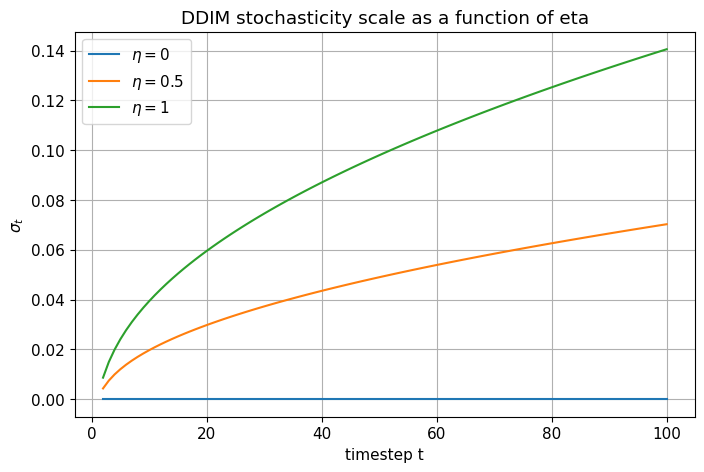

In [27]:
# Compare the DDIM sigma_t as eta varies

T = 100
betas, alphas, alpha_bars = make_linear_beta_schedule(T)

ts = np.arange(2, T + 1)
sigma_eta0 = []
sigma_eta05 = []
sigma_eta1 = []

for t in ts:
    alpha_bar_t = get_alpha_bar(alpha_bars, t)
    alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)
    sigma_eta0.append(ddim_sigma(alpha_bar_t, alpha_bar_prev, eta=0.0))
    sigma_eta05.append(ddim_sigma(alpha_bar_t, alpha_bar_prev, eta=0.5))
    sigma_eta1.append(ddim_sigma(alpha_bar_t, alpha_bar_prev, eta=1.0))

plt.figure()
plt.plot(ts, sigma_eta0, label=r'$\eta=0$')
plt.plot(ts, sigma_eta05, label=r'$\eta=0.5$')
plt.plot(ts, sigma_eta1, label=r'$\eta=1$')
plt.xlabel("timestep t")
plt.ylabel(r'$\sigma_t$')
plt.title("DDIM stochasticity scale as a function of eta")
plt.legend()
plt.show()

## Deterministic vs Stochastic DDIM

The DDIM update is

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

The only source of fresh randomness is the final term $\sigma_t z$.

---

### Deterministic DDIM

When $\eta = 0$,

$$
\sigma_t = 0,
$$

so

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}}\,\epsilon_\theta(x_t,t).
$$

This means:

- no fresh noise is injected
- the trajectory is fully determined by the starting point $x_T$
- trajectories are often smoother
- interpolation and inversion become more natural

---

### Stochastic DDIM

When $\eta > 0$,

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

Now the reverse process has two distinct sources of uncertainty:

1. the initial random sample $x_T$
2. fresh per-step noise $\sigma_t z$

As $\eta$ increases, trajectories become less deterministic and more diverse.

---

### Trajectory smoothness intuition

In deterministic DDIM, the sequence evolves by repeatedly:

1. estimating the same underlying clean content
2. re-expressing that content at progressively lower noise levels

So the latent path is often smoother than in DDPM ancestral sampling, which injects fresh perturbations at every step.

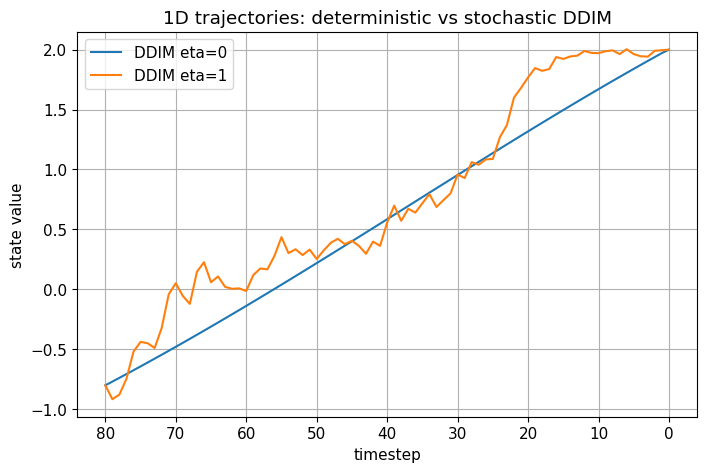

In [28]:
# 1D pedagogical trajectory comparison: deterministic vs stochastic DDIM

T = 80
betas, alphas, alpha_bars = make_linear_beta_schedule(T)
rng = np.random.default_rng(7)

def true_eps_model(x_t, t, x0_true, alpha_bars):
    alpha_bar_t = get_alpha_bar(alpha_bars, t)
    return eps_from_x0(x_t, np.array([x0_true]), alpha_bar_t)

def simulate_ddim_trajectory(x0_true=2.0, xT=None, eta=0.0, T=80, seed=0):
    betas, alphas, alpha_bars = make_linear_beta_schedule(T)
    rng = np.random.default_rng(seed)
    if xT is None:
        x_t = rng.normal(size=(1,))
    else:
        x_t = np.array([xT], dtype=np.float64)

    traj = [(T, x_t.item())]
    for t in range(T, 0, -1):
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)
        eps_pred = true_eps_model(x_t, t, x0_true, alpha_bars)
        x_t, _, _ = ddim_step_from_eps(x_t, eps_pred, alpha_bar_t, alpha_bar_prev, eta=eta, rng=rng)
        traj.append((t - 1, x_t.item()))
    return traj

traj_det = simulate_ddim_trajectory(eta=0.0, seed=5)
traj_sto = simulate_ddim_trajectory(eta=1.0, seed=5)

plt.figure()
plt.plot([t for t, x in traj_det], [x for t, x in traj_det], label="DDIM eta=0")
plt.plot([t for t, x in traj_sto], [x for t, x in traj_sto], label="DDIM eta=1")
plt.gca().invert_xaxis()
plt.xlabel("timestep")
plt.ylabel("state value")
plt.title("1D trajectories: deterministic vs stochastic DDIM")
plt.legend()
plt.show()

## Timestep Sub-Sampling

One of the main practical advantages of DDIM is that it supports reduced-step sampling naturally.

Instead of using every timestep

$$
T, T-1, \dots, 1, 0,
$$

we choose a subsequence

$$
\tau_0 = T > \tau_1 > \cdots > \tau_S = 0.
$$

At each step, we move directly from $x_{\tau_i}$ to $x_{\tau_{i+1}}$.

---

### General DDIM update for skipped steps

Let $t = \tau_i$ and $s = \tau_{i+1}$ with $s < t$. Then the generalized DDIM update is

$$
x_s
=
\sqrt{\bar\alpha_s}\,\hat x_0
+
\sqrt{1-\bar\alpha_s-\sigma_{t\to s}^2}\,\epsilon_\theta(x_t,t)
+
\sigma_{t\to s} z,
$$

where

$$
\sigma_{t\to s}(\eta)
=
\eta
\sqrt{
\frac{1-\bar\alpha_s}{1-\bar\alpha_t}
\left(
1-\frac{\bar\alpha_t}{\bar\alpha_s}
\right)
}.
$$

This is the skipped-step analogue of the adjacent-step DDIM update.

---

### Why skipping works

Once we have $\hat x_0$, we can synthesize a point at another noise level because the forward marginal form at timestep $s$ is

$$
x_s = \sqrt{\bar\alpha_s}x_0 + \sqrt{1-\bar\alpha_s}\epsilon.
$$

DDIM uses the estimated clean sample and the model-predicted direction to jump directly between noise levels.

This is why DDIM is much more naturally compatible with accelerated sampling than ancestral DDPM.

---

### What changes mathematically from DDPM?

In ancestral DDPM, the sampler is tied closely to adjacent-step posterior transitions.

In DDIM, the update is reparameterized in terms of:

- $\hat x_0$
- the target cumulative noise level $\bar\alpha_s$
- a chosen stochasticity level $\eta$

This makes step skipping a first-class part of the sampler.

In [29]:
def make_timestep_subsequence(T, num_steps):
    # Descending sequence from T to 0
    seq = np.linspace(T, 0, num_steps, dtype=int)
    seq = np.unique(seq)[::-1]

    if seq[0] != T:
        seq = np.insert(seq, 0, T)
    if seq[-1] != 0:
        seq = np.append(seq, 0)

    return seq

def simulate_ddim_subsampled(x0_true=2.0, T=100, num_steps=20, eta=0.0, seed=0):
    betas, alphas, alpha_bars = make_linear_beta_schedule(T)
    rng = np.random.default_rng(seed)
    x_t = rng.normal(size=(1,))
    seq = make_timestep_subsequence(T, num_steps)

    traj = [(int(seq[0]), x_t.item())]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])

        # Stop once we are already at x_0
        if t == 0:
            break

        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_pred = true_eps_model(x_t, t, x0_true, alpha_bars)
        x_t, _, _ = ddim_step_general(x_t, eps_pred, alpha_bar_t, alpha_bar_s, eta=eta, rng=rng)
        traj.append((s, x_t.item()))

    return seq, traj

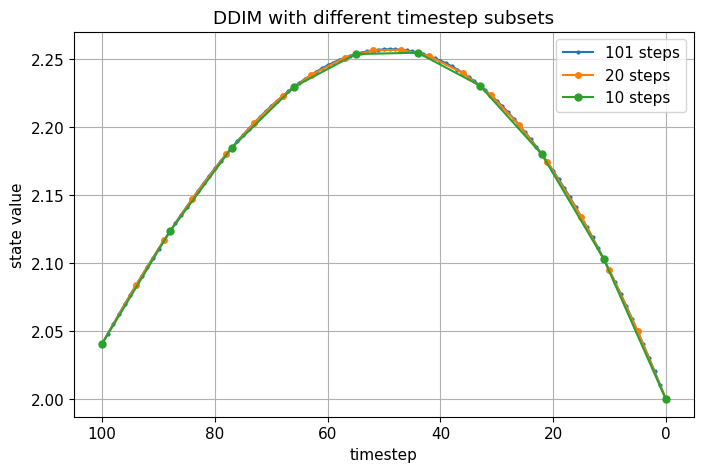

In [30]:
# Compare dense vs sparse DDIM timestep sequences

seq1, traj1 = simulate_ddim_subsampled(T=100, num_steps=101, eta=0.0, seed=3)
seq2, traj2 = simulate_ddim_subsampled(T=100, num_steps=20, eta=0.0, seed=3)
seq3, traj3 = simulate_ddim_subsampled(T=100, num_steps=10, eta=0.0, seed=3)

plt.figure()
plt.plot([t for t, x in traj1], [x for t, x in traj1], marker='o', ms=2, label='101 steps')
plt.plot([t for t, x in traj2], [x for t, x in traj2], marker='o', ms=4, label='20 steps')
plt.plot([t for t, x in traj3], [x for t, x in traj3], marker='o', ms=5, label='10 steps')
plt.gca().invert_xaxis()
plt.xlabel("timestep")
plt.ylabel("state value")
plt.title("DDIM with different timestep subsets")
plt.legend()
plt.show()

## How $\hat x_0$ and $\epsilon_\theta$ Determine the Update

A very important practical point is that the reverse step can be written in multiple equivalent parameterizations.

### From $\epsilon_\theta$ to $\hat x_0$

If the model predicts noise, then

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

Then DDIM uses

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

---

### From $\hat x_0$ to $\epsilon_\theta$

If the model instead predicts $\hat x_0$ directly, then the implied noise is

$$
\hat\epsilon
=
\frac{x_t - \sqrt{\bar\alpha_t}\,\hat x_0}{\sqrt{1-\bar\alpha_t}}.
$$

Then the same DDIM formula applies after substitution.

---

### Why this matters

This shows that DDIM is fundamentally a **sampling framework**, not a commitment to only one network output parameterization.

As long as we can consistently recover:

- $\hat x_0$
- and/or the denoising direction $\hat\epsilon$

we can execute the DDIM update.

In [31]:
# Demonstrate consistency between x0-prediction and epsilon-prediction for one DDIM step

T = 100
betas, alphas, alpha_bars = make_linear_beta_schedule(T)

t = 70
alpha_bar_t = get_alpha_bar(alpha_bars, t)
alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)

x_t = np.array([1.2])
eps_pred = np.array([-0.35])

x0_hat = x0_from_eps(x_t, eps_pred, alpha_bar_t)
eps_recovered = eps_from_x0(x_t, x0_hat, alpha_bar_t)

rng = np.random.default_rng(0)
x_prev_eps, _, sigma_eps = ddim_step_from_eps(x_t, eps_pred, alpha_bar_t, alpha_bar_prev, eta=0.0, rng=rng)

rng = np.random.default_rng(0)
x_prev_x0, _, sigma_x0 = ddim_step_from_x0(x_t, x0_hat, alpha_bar_t, alpha_bar_prev, eta=0.0, rng=rng)

print("x0_hat =", x0_hat)
print("eps recovered from x0_hat =", eps_recovered)
print("x_prev from eps =", x_prev_eps)
print("x_prev from x0 =", x_prev_x0)
print("difference =", np.abs(x_prev_eps - x_prev_x0))

x0_hat = [1.81682758]
eps recovered from x0_hat = [-0.35]
x_prev from eps = [1.21244742]
x_prev from x0 = [1.21244742]
difference = [0.]


## Classifier Guidance

We now discuss conditional guidance after DDIM itself is fully established.

### Score decomposition

For class-conditional generation with label $y$, Bayes' rule gives

$$
\log p_t(x_t \mid y)
=
\log p_t(x_t)
+
\log p_t(y \mid x_t)
-
\log p_t(y).
$$

Differentiate with respect to $x_t$:

$$
\nabla_{x_t}\log p_t(x_t \mid y)
=
\nabla_{x_t}\log p_t(x_t)
+
\nabla_{x_t}\log p_t(y \mid x_t).
$$

So the conditional score equals the unconditional score plus a classifier gradient term.

---

### Guided score

If $s_\theta(x_t,t)$ denotes the unconditional reverse score, classifier guidance defines

$$
s_{\text{guided}}(x_t,t,y)
=
s_\theta(x_t,t)
+
w\,\nabla_{x_t}\log p_\phi(y\mid x_t,t),
$$

where:

- $p_\phi(y\mid x_t,t)$ is a classifier trained on noisy samples
- $w$ is the guidance scale

---

### Convert to $\epsilon$-prediction form

For variance-preserving diffusion, the score and noise prediction are related by

$$
s_\theta(x_t,t)
\approx
-\frac{1}{\sqrt{1-\bar\alpha_t}}\epsilon_\theta(x_t,t).
$$

Therefore the guided $\epsilon$ prediction becomes

$$
\epsilon_{\text{guided}}
=
\epsilon_\theta
-
w\sqrt{1-\bar\alpha_t}\,\nabla_{x_t}\log p_\phi(y\mid x_t,t).
$$

This is the quantity used inside DDPM or DDIM sampling.

---

### Connection to DDIM

Once we have $\epsilon_{\text{guided}}$, we simply replace $\epsilon_\theta$ by $\epsilon_{\text{guided}}$ in the DDIM step:

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_{\text{guided}}}{\sqrt{\bar\alpha_t}},
$$

and

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_{\text{guided}}
+
\sigma_t z.
$$

So guidance is orthogonal to the DDPM-vs-DDIM distinction: it modifies the denoising direction used by either sampler.

## Classifier-Free Guidance

Classifier-free guidance avoids training a separate classifier.

### Basic idea

During training, the diffusion model is trained both:

- conditionally on $y$
- unconditionally, by dropping the condition with some probability

So the same model learns:

- $\epsilon_\theta(x_t,t,y)$
- $\epsilon_\theta(x_t,t,\varnothing)$

---

### CFG formula

The standard classifier-free guidance combination is

$$
\epsilon_{\text{cfg}}(x_t,t,y)
=
\epsilon_\theta(x_t,t,\varnothing)
+
w\Big(
\epsilon_\theta(x_t,t,y) - \epsilon_\theta(x_t,t,\varnothing)
\Big).
$$

Equivalent form:

$$
\epsilon_{\text{cfg}}
=
(1-w)\epsilon_\theta(x_t,t,\varnothing)
+
w\,\epsilon_\theta(x_t,t,y).
$$

---

### Interpretation

- $\epsilon_\theta(x_t,t,\varnothing)$ is the unconditional denoising direction
- $\epsilon_\theta(x_t,t,y)$ is the conditional denoising direction
- the difference estimates the conditional correction
- $w$ amplifies or attenuates that correction

Special cases:

- $w = 0$: unconditional sampling
- $w = 1$: ordinary conditional sampling
- $w > 1$: extrapolated guidance, often stronger prompt/class alignment

---

### Tradeoff between fidelity and diversity

As guidance scale $w$ increases:

- condition alignment usually improves
- diversity often decreases
- oversharpening or artifacts may appear at very high scales

This tradeoff exists for both DDPM and DDIM samplers.

In deterministic or low-noise DDIM, strong guidance can make trajectories especially rigid.

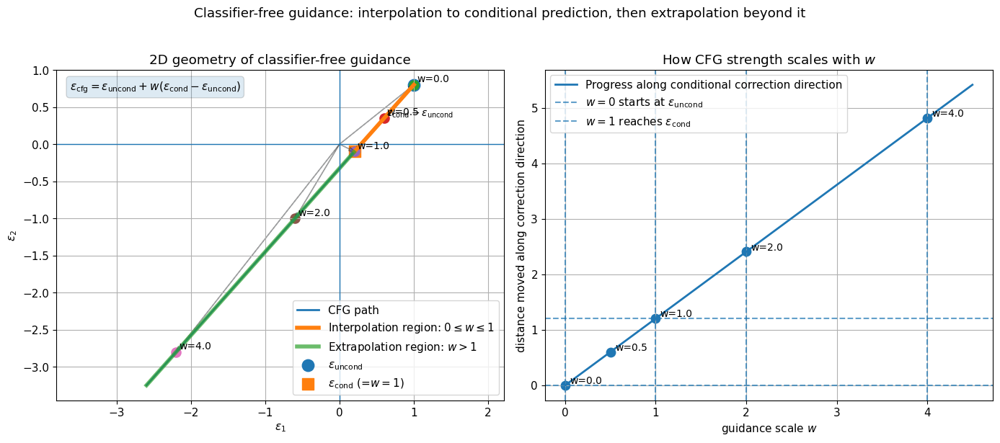

In [41]:
# More complete pedagogical visualization of classifier-free guidance in 2D epsilon-space

import numpy as np
import matplotlib.pyplot as plt

def cfg_eps(eps_uncond, eps_cond, guidance_scale):
    return eps_uncond + guidance_scale * (eps_cond - eps_uncond)

# Toy 2D epsilon predictions
eps_uncond = np.array([1.0, 0.8])
eps_cond   = np.array([0.2, -0.1])

# Guidance scales to annotate
guidance_scales = [0.0, 0.5, 1.0, 2.0, 4.0]
guided_points = [cfg_eps(eps_uncond, eps_cond, w) for w in guidance_scales]

# Continuous path
w_line = np.linspace(0, 4.5, 300)
line_points = np.array([cfg_eps(eps_uncond, eps_cond, w) for w in w_line])

# Correction direction
delta = eps_cond - eps_uncond
delta_norm = np.linalg.norm(delta)
delta_unit = delta / delta_norm

# Scalar coordinate along correction direction:
# s(w) = projection of (eps_cfg - eps_uncond) onto delta_unit = w * ||delta||
scalar_progress = np.array([
    np.dot(pt - eps_uncond, delta_unit) for pt in line_points
])

# Create figure
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# =========================
# Left panel: 2D geometry
# =========================
ax = axes[0]

# CFG path
ax.plot(line_points[:, 0], line_points[:, 1], linewidth=2, label='CFG path')

# Mark interpolation segment 0 <= w <= 1
interp_mask = (w_line >= 0) & (w_line <= 1)
ax.plot(line_points[interp_mask, 0], line_points[interp_mask, 1],
        linewidth=4, label='Interpolation region: $0 \\leq w \\leq 1$')

# Mark extrapolation segment w > 1
extra_mask = (w_line > 1)
ax.plot(line_points[extra_mask, 0], line_points[extra_mask, 1],
        linewidth=4, alpha=0.7, label='Extrapolation region: $w > 1$')

# Unconditional and conditional points
ax.scatter(eps_uncond[0], eps_uncond[1], s=140, marker='o', label=r'$\epsilon_{\mathrm{uncond}}$')
ax.scatter(eps_cond[0], eps_cond[1], s=140, marker='s', label=r'$\epsilon_{\mathrm{cond}}$ (=$w=1$)')

# Selected guided points
for w, pt in zip(guidance_scales, guided_points):
    ax.scatter(pt[0], pt[1], s=90)
    ax.text(pt[0] + 0.04, pt[1] + 0.04, f'w={w}', fontsize=10)

# Draw guided vectors from origin for a few values
origin = np.array([0.0, 0.0])
for w in [0.0, 1.0, 2.0, 4.0]:
    pt = cfg_eps(eps_uncond, eps_cond, w)
    ax.arrow(origin[0], origin[1], pt[0], pt[1],
             length_includes_head=True, head_width=0.05, alpha=0.35)

# Draw correction arrow from unconditional to conditional
ax.arrow(eps_uncond[0], eps_uncond[1], delta[0], delta[1],
         length_includes_head=True, head_width=0.05, linestyle='--', alpha=0.8)
midpoint = eps_uncond + 0.5 * delta
ax.text(midpoint[0] + 0.03, midpoint[1] + 0.03,
        r'$\epsilon_{\mathrm{cond}}-\epsilon_{\mathrm{uncond}}$',
        fontsize=10)

# Annotate formula on plot
formula_text = r'$\epsilon_{\mathrm{cfg}} = \epsilon_{\mathrm{uncond}} + w(\epsilon_{\mathrm{cond}}-\epsilon_{\mathrm{uncond}})$'
ax.text(0.03, 0.97, formula_text, transform=ax.transAxes,
        va='top', ha='left',
        bbox=dict(boxstyle='round', alpha=0.15))

ax.axhline(0, linewidth=1)
ax.axvline(0, linewidth=1)
ax.set_xlabel(r'$\epsilon_1$')
ax.set_ylabel(r'$\epsilon_2$')
ax.set_title('2D geometry of classifier-free guidance')
ax.axis('equal')
ax.legend(loc='best')

# ============================================
# Right panel: movement along correction axis
# ============================================
ax2 = axes[1]

ax2.plot(w_line, scalar_progress, linewidth=2, label='Progress along conditional correction direction')

# Vertical lines at important guidance scales
for w in [0, 1, 2, 4]:
    ax2.axvline(w, linestyle='--', alpha=0.7)

# Horizontal reference lines
ax2.axhline(0, linestyle='--', alpha=0.7, label=r'$w=0$ starts at $\epsilon_{\mathrm{uncond}}$')
ax2.axhline(delta_norm, linestyle='--', alpha=0.7, label=r'$w=1$ reaches $\epsilon_{\mathrm{cond}}$')

# Selected points
selected_progress = [np.dot(pt - eps_uncond, delta_unit) for pt in guided_points]
ax2.scatter(guidance_scales, selected_progress, s=80)

for w, s in zip(guidance_scales, selected_progress):
    ax2.text(w + 0.05, s + 0.03, f'w={w}', fontsize=10)

ax2.set_xlabel('guidance scale $w$')
ax2.set_ylabel('distance moved along correction direction')
ax2.set_title('How CFG strength scales with $w$')
ax2.legend(loc='best')

plt.suptitle('Classifier-free guidance: interpolation to conditional prediction, then extrapolation beyond it', y=1.02)
plt.tight_layout()
plt.show()

## Algorithm: DDIM Sampling

Below is the algorithmic structure for DDIM sampling.

### Inputs

- trained denoiser $\epsilon_\theta(x_t,t)$
- noise schedule $\{\alpha_t\}_{t=1}^T$
- cumulative schedule $\bar\alpha_t = \prod_{s=1}^t \alpha_s$
- timestep subsequence $\tau_0 = T > \tau_1 > \cdots > \tau_S = 0$
- stochasticity parameter $\eta$
- initial noise $x_{\tau_0} \sim \mathcal N(0,I)$

### DDIM sampling algorithm

For $i = 0, 1, \dots, S-1$:

1. set $t = \tau_i$ and $s = \tau_{i+1}$

2. predict noise:

   $$
   \epsilon_t = \epsilon_\theta(x_t, t)
   $$

3. reconstruct clean sample:

   $$
   \hat x_0
   =
   \frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_t}{\sqrt{\bar\alpha_t}}
   $$

4. compute stochasticity scale:

   $$
   \sigma_{t\to s}
   =
   \eta
   \sqrt{
   \frac{1-\bar\alpha_s}{1-\bar\alpha_t}
   \left(
   1-\frac{\bar\alpha_t}{\bar\alpha_s}
   \right)
   }
   $$

5. sample $z \sim \mathcal N(0,I)$ if $\eta > 0$

6. update:

   $$
   x_s
   =
   \sqrt{\bar\alpha_s}\,\hat x_0
   +
   \sqrt{1-\bar\alpha_s-\sigma_{t\to s}^2}\,\epsilon_t
   +
   \sigma_{t\to s} z
   $$

Output $x_0$.

---

### Important interpretation

This algorithm differs from ancestral DDPM in two ways:

1. it is written in reparameterized form using $\hat x_0$
2. it naturally allows sparse timestep subsets

## Algorithm: DDIM Sampling with Classifier-Free Guidance

Now we include classifier-free guidance inside DDIM.

### Inputs

- conditional denoiser outputs:
  - $\epsilon_\theta(x_t,t,\varnothing)$
  - $\epsilon_\theta(x_t,t,y)$
- guidance scale $w$
- all DDIM inputs from the previous section

### CFG-DDIM algorithm

For each reverse step from $t$ to $s$:

1. compute unconditional prediction:

   $$
   \epsilon_u = \epsilon_\theta(x_t,t,\varnothing)
   $$

2. compute conditional prediction:

   $$
   \epsilon_c = \epsilon_\theta(x_t,t,y)
   $$

3. combine using classifier-free guidance:

   $$
   \epsilon_{\text{cfg}}
   =
   \epsilon_u + w(\epsilon_c - \epsilon_u)
   $$

4. reconstruct clean sample:

   $$
   \hat x_0
   =
   \frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_{\text{cfg}}}{\sqrt{\bar\alpha_t}}
   $$

5. compute $\sigma_{t\to s}(\eta)$

6. update:

   $$
   x_s
   =
   \sqrt{\bar\alpha_s}\,\hat x_0
   +
   \sqrt{1-\bar\alpha_s-\sigma_{t\to s}^2}\,\epsilon_{\text{cfg}}
   +
   \sigma_{t\to s} z
   $$

Output the final $x_0$.

---

### Interpretation

CFG changes the denoising direction before the sampler update is applied.  
The DDIM structure remains the same; only the effective $\epsilon$ prediction changes.

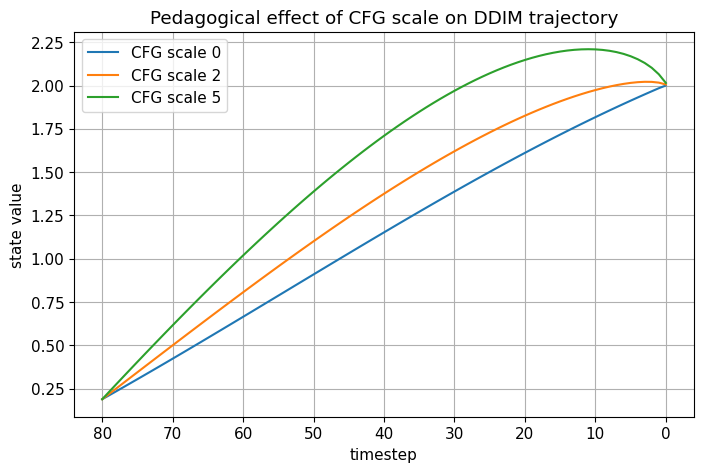

In [34]:
# Simplified pedagogical DDIM + CFG trajectory demo in 1D

T = 80
betas, alphas, alpha_bars = make_linear_beta_schedule(T)

def simulate_cfg_ddim_trajectory(x0_true=2.0, cond_bias=-0.3, guidance_scale=0.0, eta=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x_t = rng.normal(size=(1,))
    traj = [(T, x_t.item())]

    for t in range(T, 0, -1):
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)

        # unconditional "teacher"
        eps_uncond = eps_from_x0(x_t, np.array([x0_true]), alpha_bar_t)

        # conditional branch = perturbed direction in a pedagogical way
        eps_cond = eps_uncond + cond_bias

        eps_guided = cfg_eps(eps_uncond, eps_cond, guidance_scale)
        x_t, _, _ = ddim_step_from_eps(x_t, eps_guided, alpha_bar_t, alpha_bar_prev, eta=eta, rng=rng)
        traj.append((t - 1, x_t.item()))
    return traj

traj_w0 = simulate_cfg_ddim_trajectory(guidance_scale=0.0, eta=0.0, seed=2)
traj_w2 = simulate_cfg_ddim_trajectory(guidance_scale=2.0, eta=0.0, seed=2)
traj_w5 = simulate_cfg_ddim_trajectory(guidance_scale=5.0, eta=0.0, seed=2)

plt.figure()
plt.plot([t for t, x in traj_w0], [x for t, x in traj_w0], label='CFG scale 0')
plt.plot([t for t, x in traj_w2], [x for t, x in traj_w2], label='CFG scale 2')
plt.plot([t for t, x in traj_w5], [x for t, x in traj_w5], label='CFG scale 5')
plt.gca().invert_xaxis()
plt.xlabel("timestep")
plt.ylabel("state value")
plt.title("Pedagogical effect of CFG scale on DDIM trajectory")
plt.legend()
plt.show()

## Compact Comparison: DDPM vs DDIM vs DDIM + CFG

This section summarizes the practical differences.

### DDPM ancestral sampling

Update:

$$
x_{t-1} = \mu_\theta(x_t,t) + \sigma_t z
$$

Characteristics:

- stochastic at every step
- closely tied to the posterior structure
- usually many steps
- good diversity due to repeated noise injection

---

### DDIM

Update:

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta
+
\sigma_t z
$$

Characteristics:

- can be deterministic when $\eta=0$
- naturally supports timestep skipping
- often much faster
- often smoother latent trajectories
- diversity may reduce when $\eta$ is very small

---

### DDIM + CFG

Update uses guided noise prediction

$$
\epsilon_{\text{cfg}}
=
\epsilon_\theta(x_t,t,\varnothing)
+
w\big(\epsilon_\theta(x_t,t,y)-\epsilon_\theta(x_t,t,\varnothing)\big)
$$

and then the usual DDIM formula.

Characteristics:

- inherits DDIM speed and controllability
- improves condition fidelity
- may reduce diversity as guidance scale increases
- strong guidance can produce rigid trajectories or artifacts

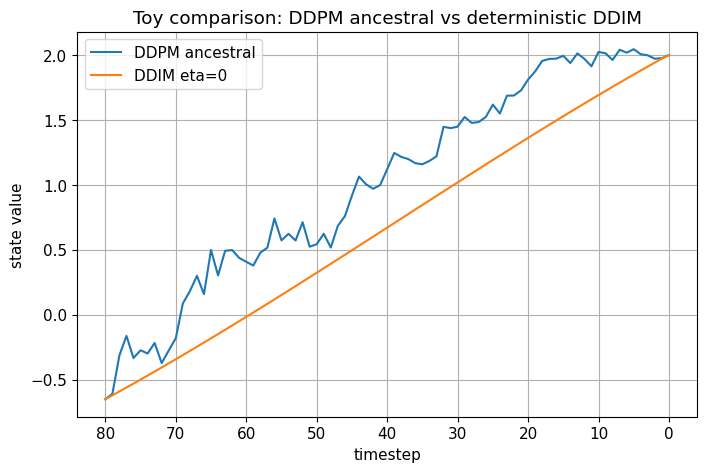

In [35]:
# Compare DDPM-style stochastic update and DDIM deterministic update in a 1D toy setting

T = 80
betas, alphas, alpha_bars = make_linear_beta_schedule(T)

def simulate_ddpm_ancestral_trajectory(x0_true=2.0, T=80, seed=0):
    rng = np.random.default_rng(seed)
    x_t = rng.normal(size=(1,))
    traj = [(T, x_t.item())]
    for t in range(T, 0, -1):
        beta_t = betas[t - 1]
        alpha_t = alphas[t - 1]
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_prev = get_alpha_bar(alpha_bars, t - 1)
        eps_pred = eps_from_x0(x_t, np.array([x0_true]), alpha_bar_t)
        mu = ddpm_mean_from_eps(x_t, eps_pred, alpha_t, alpha_bar_t)
        sigma = np.sqrt(posterior_variance(beta_t, alpha_bar_t, alpha_bar_prev))
        x_t = mu + sigma * rng.normal(size=(1,))
        traj.append((t - 1, x_t.item()))
    return traj

traj_ddpm = simulate_ddpm_ancestral_trajectory(seed=4)
traj_ddim = simulate_ddim_trajectory(eta=0.0, seed=4)

plt.figure()
plt.plot([t for t, x in traj_ddpm], [x for t, x in traj_ddpm], label='DDPM ancestral')
plt.plot([t for t, x in traj_ddim], [x for t, x in traj_ddim], label='DDIM eta=0')
plt.gca().invert_xaxis()
plt.xlabel("timestep")
plt.ylabel("state value")
plt.title("Toy comparison: DDPM ancestral vs deterministic DDIM")
plt.legend()
plt.show()

## Implementation Notes

This section summarizes the key implementation choices.

### 1. The model can predict different quantities

The sampler may be implemented using:

- $\epsilon$-prediction
- $x_0$-prediction
- $v$-prediction

But the DDIM step is easiest to think about in terms of $\hat x_0$ and $\hat\epsilon$.

---

### 2. Use a helper to reconstruct $\hat x_0$

For $\epsilon$-prediction:

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

This helper is central and should be implemented carefully.

---

### 3. Timestep skipping requires a chosen sequence

Instead of all timesteps, select a sequence such as:

- uniform in index
- quadratic spacing
- custom hand-designed schedules

The DDIM formulas use the corresponding $\bar\alpha_t$ values directly.

---

### 4. Deterministic DDIM is often used for inversion/editing

Because the mapping is deterministic given the initial noise, DDIM is often used when we want more stable trajectories, interpolation, or inversion-style reasoning.

---

### 5. Guidance is inserted before the sampler update

For classifier-free guidance:

1. get unconditional prediction
2. get conditional prediction
3. combine them to get $\epsilon_{\text{cfg}}$
4. use $\epsilon_{\text{cfg}}$ inside the DDIM update

So guidance modifies the denoiser output, not the structural form of the DDIM formula.

---

### 6. Numerical stability

In practice, implementations often:

- clip or threshold $\hat x_0$
- ensure square-root arguments are nonnegative
- use precomputed tensors for $\alpha_t$ and $\bar\alpha_t$
- carefully handle timestep indexing conventions

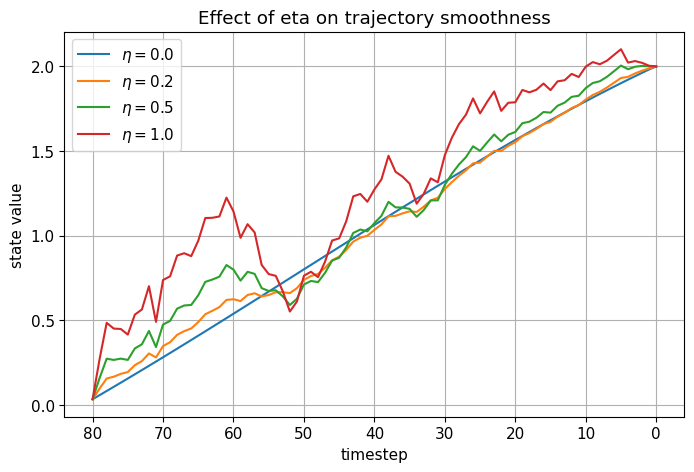

In [36]:
# Show how eta affects trajectory smoothness by plotting several trajectories from the same start

etas = [0.0, 0.2, 0.5, 1.0]
plt.figure()

for eta in etas:
    traj = simulate_ddim_trajectory(eta=eta, seed=11)
    plt.plot([t for t, x in traj], [x for t, x in traj], label=fr'$\eta={eta}$')

plt.gca().invert_xaxis()
plt.xlabel("timestep")
plt.ylabel("state value")
plt.title("Effect of eta on trajectory smoothness")
plt.legend()
plt.show()

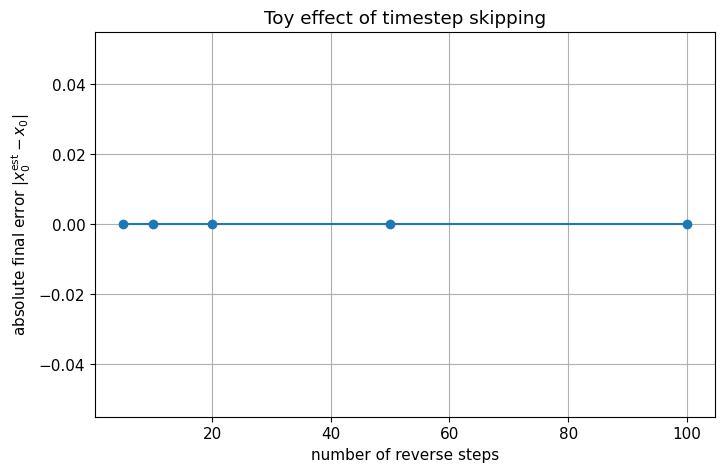

In [37]:
# Visualize the effect of timestep skipping on final error in a toy setting

T = 100
x0_true = 2.0
step_counts = [100, 50, 20, 10, 5]
final_errors = []

for num_steps in step_counts:
    _, traj = simulate_ddim_subsampled(x0_true=x0_true, T=T, num_steps=num_steps, eta=0.0, seed=13)
    x0_est = traj[-1][1]
    final_errors.append(abs(x0_est - x0_true))

plt.figure()
plt.plot(step_counts, final_errors, marker='o')
plt.xlabel("number of reverse steps")
plt.ylabel(r"absolute final error $|x_0^{\mathrm{est}} - x_0|$")
plt.title("Toy effect of timestep skipping")
plt.show()

## Common Confusions

### 1. Is DDIM a new training objective?

Not necessarily. The key practical point is that DDIM reuses the same denoiser trained under the DDPM-style objective. What changes is the sampler.

---

### 2. Is DDIM just DDPM with no noise?

That is only partly true. Deterministic DDIM is the $\eta=0$ limit, but DDIM is more generally a family of reparameterized samplers that also supports arbitrary timestep skipping.

---

### 3. Why does deterministic DDIM still generate diverse samples?

Because the initial state $x_T$ is still sampled from a random Gaussian. The reverse path is deterministic conditioned on this initial point, but the overall generative model remains random through its starting noise.

---

### 4. Why is DDIM often said to be non-Markovian?

The main idea is that DDIM corresponds to a broader process family that preserves the same marginals $q(x_t\mid x_0)$ while not being tied to the original DDPM ancestral Markov chain interpretation.

---

### 5. Why do smoother trajectories appear in DDIM?

Because deterministic or low-noise DDIM does not inject fresh Gaussian perturbations at every step. Instead, it repeatedly projects the estimated clean content to lower-noise levels.

---

### 6. Is guidance specific to DDIM?

No. Guidance modifies the denoising direction and can be used with DDPM, DDIM, and many other diffusion samplers.

---

### 7. Why can very large guidance scale hurt samples?

Because it over-amplifies the conditional correction. This usually improves fidelity to the condition but can reduce diversity and produce unnatural or oversharpened outputs.

## Summary

We can now summarize the full notebook in a compact way.

### Core DDIM idea

Given a noisy point $x_t$, use the denoiser to reconstruct

$$
\hat x_0
=
\frac{x_t - \sqrt{1-\bar\alpha_t}\,\epsilon_\theta(x_t,t)}{\sqrt{\bar\alpha_t}}.
$$

Then move to a lower noise level using

$$
x_{t-1}
=
\sqrt{\bar\alpha_{t-1}}\,\hat x_0
+
\sqrt{1-\bar\alpha_{t-1}-\sigma_t^2}\,\epsilon_\theta(x_t,t)
+
\sigma_t z.
$$

---

### What DDIM changes relative to DDPM

DDPM:
- ancestral posterior-style sampling
- fresh noise every step
- often many reverse steps

DDIM:
- reparameterized update via $\hat x_0$
- optional stochasticity controlled by $\eta$
- natural timestep skipping
- deterministic generation when $\eta = 0$

---

### Why DDIM is useful

DDIM is important because it offers:

- faster sampling
- smoother trajectories
- deterministic paths for inversion/interpolation
- compatibility with guidance methods

---

### Final conceptual takeaway

DDIM should be understood as a **sampler family built on top of the DDPM denoiser**.  
The model training can stay the same, while the reverse-time generation path becomes more flexible, faster, and in special cases deterministic.

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

# Reuse the same exact helper definitions from Animation 1.
# If Cell 1 is already run in the notebook, you do not need to redefine them.
# This cell is provided so Animation 2 can stand alone if needed.

def make_pinwheel(
    n_samples=1800,
    radial_std=0.28,
    tangential_std=0.10,
    num_classes=5,
    rate=0.25,
    scale=2.4,
    seed=7,
):
    rng = np.random.default_rng(seed)
    counts = np.full(num_classes, n_samples // num_classes, dtype=int)
    counts[: n_samples % num_classes] += 1
    labels = np.concatenate([np.full(c, k, dtype=int) for k, c in enumerate(counts)])
    r = rng.normal(loc=1.0, scale=radial_std, size=n_samples)
    t = rng.normal(loc=0.0, scale=tangential_std, size=n_samples)
    base = 2.0 * np.pi * labels / num_classes
    angles = base + rate * np.exp(r) + t
    x = np.stack([r * np.cos(angles), r * np.sin(angles)], axis=1)
    x *= scale
    perm = rng.permutation(n_samples)
    return x[perm], labels[perm]

def make_linear_beta_schedule(T, beta_start=1e-4, beta_end=2e-2):
    betas = np.linspace(beta_start, beta_end, T, dtype=np.float64)
    alphas = 1.0 - betas
    alpha_bars = np.cumprod(alphas)
    return betas, alphas, alpha_bars

def get_alpha_bar(alpha_bars, t):
    if t == 0:
        return 1.0
    return float(alpha_bars[t - 1])

def x0_from_eps(x_t, eps_pred, alpha_bar_t, eps=1e-12):
    return (x_t - np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * eps_pred) / np.sqrt(max(alpha_bar_t, eps))

def eps_from_x0(x_t, x0_hat, alpha_bar_t, eps=1e-12):
    denom = np.sqrt(max(1.0 - alpha_bar_t, 0.0))
    if denom < eps:
        return np.zeros_like(x_t)
    return (x_t - np.sqrt(alpha_bar_t) * x0_hat) / denom

def ddim_sigma(alpha_bar_t, alpha_bar_s, eta, eps=1e-12):
    if alpha_bar_t >= 1.0 - eps:
        return 0.0
    inside = ((1.0 - alpha_bar_s) / max(1.0 - alpha_bar_t, eps)) * \
             max(1.0 - alpha_bar_t / max(alpha_bar_s, eps), 0.0)
    return float(eta) * np.sqrt(max(inside, 0.0))

def ddim_step_general(x_t, eps_pred, alpha_bar_t, alpha_bar_s, eta, rng):
    x0_hat = x0_from_eps(x_t, eps_pred, alpha_bar_t)
    sigma_ts = ddim_sigma(alpha_bar_t, alpha_bar_s, eta)
    dir_coeff = np.sqrt(max(1.0 - alpha_bar_s - sigma_ts**2, 0.0))
    z = rng.normal(size=x_t.shape)
    x_s = np.sqrt(max(alpha_bar_s, 0.0)) * x0_hat + dir_coeff * eps_pred + sigma_ts * z
    return x_s, x0_hat, sigma_ts

def compute_class_prototypes(x0, y, num_classes):
    prototypes = np.zeros((num_classes, 2), dtype=np.float64)
    for k in range(num_classes):
        prototypes[k] = x0[y == k].mean(axis=0)
    return prototypes

def unconditional_eps_model(x_t, x0_true, prototypes, y, alpha_bar_t):
    proto = prototypes[y]
    x0_blend = 0.72 * x0_true + 0.28 * proto
    eps_uncond = eps_from_x0(x_t, x0_blend, alpha_bar_t)
    smooth_bias = 0.10 * x_t
    return 0.92 * eps_uncond + 0.08 * smooth_bias

def conditional_eps_model(x_t, x0_true, alpha_bar_t):
    return eps_from_x0(x_t, x0_true, alpha_bar_t)

def cfg_eps(eps_uncond, eps_cond, guidance_scale):
    return eps_uncond + guidance_scale * (eps_cond - eps_uncond)

def classifier_guidance_eps(eps_uncond, x_t, y, prototypes, alpha_bar_t, guidance_scale):
    target = prototypes[y]
    grad = target - x_t
    return eps_uncond - guidance_scale * np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * grad

def forward_corrupt(x0, alpha_bar_t, rng):
    eps = rng.normal(size=x0.shape)
    x_t = np.sqrt(alpha_bar_t) * x0 + np.sqrt(max(1.0 - alpha_bar_t, 0.0)) * eps
    return x_t, eps

def make_timestep_subsequence(T, num_steps):
    seq = np.linspace(T, 0, num_steps, dtype=int)
    seq = np.unique(seq)[::-1]
    if seq[0] != T:
        seq = np.insert(seq, 0, T)
    if seq[-1] != 0:
        seq = np.append(seq, 0)
    return seq

def class_colors(y, cmap_name="tab10"):
    cmap = plt.get_cmap(cmap_name)
    classes = np.unique(y)
    color_map = {k: cmap(i % 10) for i, k in enumerate(classes)}
    return np.array([color_map[k] for k in y])

def axis_limits(*arrays, pad=0.7):
    mins = np.min(np.concatenate(arrays, axis=0), axis=0)
    maxs = np.max(np.concatenate(arrays, axis=0), axis=0)
    center = 0.5 * (mins + maxs)
    radius = 0.5 * np.max(maxs - mins) + pad
    return (center[0] - radius, center[0] + radius), (center[1] - radius, center[1] + radius)

def simulate_ddim_sequence(x0, y, x_T, alpha_bars, prototypes, T=120, num_steps=28, eta=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    seq = make_timestep_subsequence(T, num_steps)
    states = [x_t.copy()]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_pred = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        x_t, _, _ = ddim_step_general(x_t, eps_pred, alpha_bar_t, alpha_bar_s, eta, rng)
        states.append(x_t.copy())

    return seq, states

def simulate_classifier_guided_ddim_sequence(x0, y, x_T, alpha_bars, prototypes, T=120, guidance_scale=0.55, num_steps=28, eta=0.05, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    seq = make_timestep_subsequence(T, num_steps)
    states = [x_t.copy()]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_u = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        eps_guided = classifier_guidance_eps(eps_u, x_t, y, prototypes, alpha_bar_t, guidance_scale)
        x_t, _, _ = ddim_step_general(x_t, eps_guided, alpha_bar_t, alpha_bar_s, eta, rng)
        states.append(x_t.copy())

    return seq, states

def simulate_cfg_ddim_sequence(x0, y, x_T, alpha_bars, prototypes, T=120, guidance_scale=3.0, num_steps=28, eta=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x_t = x_T.copy()
    seq = make_timestep_subsequence(T, num_steps)
    states = [x_t.copy()]

    for i in range(len(seq) - 1):
        t = int(seq[i])
        s = int(seq[i + 1])
        alpha_bar_t = get_alpha_bar(alpha_bars, t)
        alpha_bar_s = get_alpha_bar(alpha_bars, s)

        eps_u = unconditional_eps_model(x_t, x0, prototypes, y, alpha_bar_t)
        eps_c = conditional_eps_model(x_t, x0, alpha_bar_t)
        eps_guided = cfg_eps(eps_u, eps_c, guidance_scale)

        x_t, _, _ = ddim_step_general(x_t, eps_guided, alpha_bar_t, alpha_bar_s, eta, rng)
        states.append(x_t.copy())

    return seq, states

def upsample_states_to_common_length(states, target_len):
    idx = np.linspace(0, len(states) - 1, target_len)
    idx = np.round(idx).astype(int)
    return [states[i] for i in idx]

def upsample_seq_to_common_length(seq, target_len):
    idx = np.linspace(0, len(seq) - 1, target_len)
    idx = np.round(idx).astype(int)
    return [int(seq[i]) for i in idx]

# ============================================================
# Animation 2: trajectory-focused view
# DDIM vs classifier guidance vs CFG
# ============================================================

T = 120

x0, y = make_pinwheel(
    n_samples=1800,
    radial_std=0.28,
    tangential_std=0.10,
    num_classes=5,
    rate=0.28,
    scale=2.5,
    seed=12,
)

colors = class_colors(y)
num_classes = len(np.unique(y))
prototypes = compute_class_prototypes(x0, y, num_classes)

betas, alphas, alpha_bars = make_linear_beta_schedule(T)

rng_master = np.random.default_rng(5)
alpha_bar_T = get_alpha_bar(alpha_bars, T)
x_T, _ = forward_corrupt(x0, alpha_bar_T, rng_master)

seq_ddim, states_ddim = simulate_ddim_sequence(
    x0, y, x_T, alpha_bars, prototypes, T=T, num_steps=28, eta=0.0, seed=11
)

seq_cg, states_cg = simulate_classifier_guided_ddim_sequence(
    x0, y, x_T, alpha_bars, prototypes, T=T, guidance_scale=0.55, num_steps=28, eta=0.05, seed=11
)

seq_cfg, states_cfg = simulate_cfg_ddim_sequence(
    x0, y, x_T, alpha_bars, prototypes, T=T, guidance_scale=3.0, num_steps=28, eta=0.0, seed=11
)

common_frames = max(len(states_ddim), len(states_cg), len(states_cfg))

states_ddim_u = upsample_states_to_common_length(states_ddim, common_frames)
states_cg_u   = upsample_states_to_common_length(states_cg, common_frames)
states_cfg_u  = upsample_states_to_common_length(states_cfg, common_frames)

seq_ddim_u = upsample_seq_to_common_length(seq_ddim, common_frames)
seq_cg_u   = upsample_seq_to_common_length(seq_cg, common_frames)
seq_cfg_u  = upsample_seq_to_common_length(seq_cfg, common_frames)

all_states = [x0, x_T] + states_ddim_u + states_cg_u + states_cfg_u
xlim, ylim = axis_limits(*all_states, pad=0.9)

rng = np.random.default_rng(123)
subset_idx = rng.choice(len(x0), size=45, replace=False)

fig, axes = plt.subplots(1, 3, figsize=(15.8, 5.25))
titles = [
    "DDIM trajectories",
    "DDIM + classifier guidance trajectories",
    "DDIM + classifier-free guidance trajectories",
]

for ax, title in zip(axes, titles):
    ax.set_title(title, pad=6)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_aspect("equal")
    ax.grid(True, alpha=0.25)
    ax.scatter(x0[:, 0], x0[:, 1], s=5, c="lightgray", alpha=0.16, linewidths=0)

axes[1].scatter(
    prototypes[:, 0], prototypes[:, 1],
    s=160, marker='X',
    c=np.unique(colors, axis=0)[:len(prototypes)],
    edgecolors='black', linewidths=1.0, alpha=0.92
)

sc_ddim = axes[0].scatter(states_ddim_u[0][:, 0], states_ddim_u[0][:, 1], s=9, c=colors, alpha=0.78, linewidths=0)
sc_cg   = axes[1].scatter(states_cg_u[0][:, 0],   states_cg_u[0][:, 1],   s=9, c=colors, alpha=0.78, linewidths=0)
sc_cfg  = axes[2].scatter(states_cfg_u[0][:, 0],  states_cfg_u[0][:, 1],  s=9, c=colors, alpha=0.78, linewidths=0)

traj_lines_ddim = [axes[0].plot([], [], lw=1.3, alpha=0.85, color=colors[idx])[0] for idx in subset_idx]
traj_lines_cg   = [axes[1].plot([], [], lw=1.3, alpha=0.85, color=colors[idx])[0] for idx in subset_idx]
traj_lines_cfg  = [axes[2].plot([], [], lw=1.3, alpha=0.85, color=colors[idx])[0] for idx in subset_idx]

formula_ddim = (
    r'$\hat{x}_0 = \frac{x_t - \sqrt{1-\bar{\alpha}_t}\,\epsilon_\theta}{\sqrt{\bar{\alpha}_t}}$'
    '\n'
    r'$x_s = \sqrt{\bar{\alpha}_s}\hat{x}_0 + \sqrt{1-\bar{\alpha}_s-\sigma^2}\,\epsilon_\theta + \sigma z$'
)
formula_cg = (
    r'$\epsilon_{\mathrm{guided}} = \epsilon_{\mathrm{u}} - \lambda \sqrt{1-\bar{\alpha}_t}\,\nabla_{x_t}\log p(y|x_t)$'
    '\n'
    r'classifier guidance adds a class-directed correction'
)
formula_cfg = (
    r'$\epsilon_{\mathrm{cfg}} = \epsilon_{\mathrm{u}} + w(\epsilon_{\mathrm{c}}-\epsilon_{\mathrm{u}})$'
    '\n'
    r'CFG amplifies the conditional correction direction'
)

for ax, txt in zip(axes, [formula_ddim, formula_cg, formula_cfg]):
    ax.text(
        0.02, 0.98, txt,
        transform=ax.transAxes,
        va='top', ha='left',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.80, edgecolor='none'),
        fontsize=9
    )

suptitle = fig.suptitle(
    "Trajectory view: how DDIM and guidance shape the reverse path",
    fontsize=14.5,
    y=0.955
)

fig.subplots_adjust(
    left=0.04,
    right=0.99,
    bottom=0.07,
    top=0.80,
    wspace=0.08,
    hspace=0.0
)

def update_traj(frame):
    arr_ddim = states_ddim_u[frame]
    arr_cg   = states_cg_u[frame]
    arr_cfg  = states_cfg_u[frame]

    sc_ddim.set_offsets(arr_ddim)
    sc_cg.set_offsets(arr_cg)
    sc_cfg.set_offsets(arr_cfg)

    for line, idx in zip(traj_lines_ddim, subset_idx):
        pts = np.array([states_ddim_u[k][idx] for k in range(frame + 1)])
        line.set_data(pts[:, 0], pts[:, 1])

    for line, idx in zip(traj_lines_cg, subset_idx):
        pts = np.array([states_cg_u[k][idx] for k in range(frame + 1)])
        line.set_data(pts[:, 0], pts[:, 1])

    for line, idx in zip(traj_lines_cfg, subset_idx):
        pts = np.array([states_cfg_u[k][idx] for k in range(frame + 1)])
        line.set_data(pts[:, 0], pts[:, 1])

    t_show = max(seq_ddim_u[frame], seq_cg_u[frame], seq_cfg_u[frame])
    suptitle.set_text(f"Trajectory view: how DDIM and guidance shape the reverse path (t ≈ {t_show})")

    return [sc_ddim, sc_cg, sc_cfg, suptitle] + traj_lines_ddim + traj_lines_cg + traj_lines_cfg

anim_traj = FuncAnimation(
    fig,
    update_traj,
    frames=common_frames,
    interval=220,
    blit=False,
    repeat=True
)

plt.close(fig)
display(HTML(anim_traj.to_jshtml()))